In [3]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import ipywidgets as widgets
from IPython.display import display, clear_output, HTML

# Grid for heatmap
x_vals = np.linspace(0, 10, 100)
z_vals = np.linspace(0, 10, 100)

# Widgets
n = widgets.IntSlider(min=1, max=9, step=2, value=1, description='# of Waves')
display(n)

# Columns for sliders
a_column = widgets.VBox()
ω_column = widgets.VBox()
k_column = widgets.VBox()
m_column = widgets.VBox()
sliders_box = widgets.HBox([a_column, ω_column, k_column, m_column])
display(sliders_box)

# Create sliders for each wave
def make_sliders(i):
    a = widgets.FloatSlider(min=0, max=10, step=0.01, value=1, description=f'a{i}')
    ω = widgets.FloatSlider(min=0, max=10, step=1, value=1, description=f'ω{i}')
    k = widgets.FloatSlider(min=0, max=10, step=1, value=1, description=f'k{i}')
    m = widgets.FloatSlider(min=0, max=10, step=1, value=1, description=f'm{i}')
    return {'a': a, 'ω': ω, 'k': k, 'm': m}

# Triadic logic for "k" sliders only
def triadic(j):
    if len(line_sliders) < 3:
        return

    k1 = line_sliders[0][j]  # Only k1 is user-controlled

    for i in range(1, len(line_sliders) - 1, 2):  # i = 1, 3, 5, ...
        k_even = line_sliders[i][j]
        k_next = line_sliders[i + 1][j]

        def setup_pair(k_even=k_even, k_next=k_next):
            def update_even(change):
                k_next.unobserve(update_next, names='value')
                k_next.value = k1.value - k_even.value
                k_next.observe(update_next, names='value')

            def update_next(change):
                k_even.unobserve(update_even, names='value')
                k_even.value = k1.value - k_next.value
                k_even.observe(update_even, names='value')

            k_even.observe(update_even, names='value')
            k_next.observe(update_next, names='value')

        setup_pair()

# Update sliders when n changes
line_sliders = []
def update_sliders(change=None):
    a_column.children = ()
    ω_column.children = ()
    k_column.children = ()
    m_column.children = ()
    line_sliders.clear()
    for i in range(n.value):
        sliders = make_sliders(i + 1)
        line_sliders.append(sliders)
        a_column.children += (sliders['a'],)
        ω_column.children += (sliders['ω'],)
        k_column.children += (sliders['k'],)
        m_column.children += (sliders['m'],)
    triadic('ω')
    triadic('k')
    triadic('m')

n.observe(update_sliders, names='value')
update_sliders(None)

# Generate wave button
start_button = widgets.Button(description="Generate Wave")
display(start_button)

def start_animation(b):
    clear_output(wait=True)
    display(n)
    display(sliders_box)
    display(start_button)

    fig, ax = plt.subplots(figsize=(12, 6))
    im = ax.imshow(np.zeros((len(z_vals), len(x_vals))), cmap='coolwarm', vmin=-10, vmax=10, origin='lower',
                   extent=[x_vals.min(), x_vals.max(), z_vals.min(), z_vals.max()], aspect='auto')
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_title("Combined Wave Heatmap")
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label('u(x,z,t) at y = 0')

    X, Z = np.meshgrid(x_vals, z_vals)

    def animate(frame):
        dt = 0.1
        current_t = frame * dt
        u = np.zeros_like(X)
        for sliders in line_sliders:
            a = sliders['a'].value
            ω = sliders['ω'].value
            k = sliders['k'].value
            m = sliders['m'].value
            u += a * np.sin(m * Z + k * X - ω * current_t)
        im.set_data(u)
        return [im]

    ani = FuncAnimation(fig, animate, frames=100, interval=100, blit=True)
    display(HTML(ani.to_jshtml()))

start_button.on_click(start_animation)


IntSlider(value=1, description='# of Waves', max=9, min=1, step=2)

Button(description='Generate Wave', style=ButtonStyle())

Button(description='Generate Wave', style=ButtonStyle())

Output()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

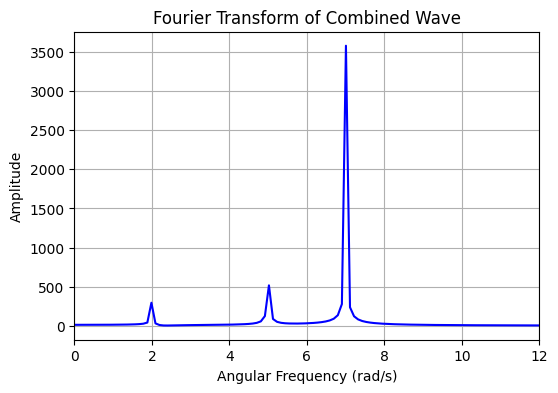

In [ ]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import ipywidgets as widgets
from IPython.display import display, clear_output, HTML
from numpy.fft import fft, ifft

# Widgets
n = widgets.IntSlider(min=1, max=10, step=2, value=1, description='# of Waves')
v = widgets.FloatText(min=0, max=10, step=0.01, value=1, description='Velocity')
s = widgets.Checkbox(description='Sync By Velocity', value=False, indent=False)
g = widgets.Checkbox(description='Split Graphs', value=True, indent=False)  # Split graphs checkbox
master_box = widgets.HBox([n, v, s, g])
display(master_box)

# Columns for sliders
a_column = widgets.VBox()
ω_column = widgets.VBox()
k_column = widgets.VBox()
sliders_box = widgets.HBox([a_column, ω_column, k_column])

# Container for all sliders
gridsliders_box = widgets.HBox([sliders_box])
display(gridsliders_box)

# Line sliders
line_sliders = []

# Function to make sliders
def make_sliders(index):
    a = widgets.FloatSlider(min=0, max=10, step=0.01, description=f'a{index}')
    ω = widgets.FloatSlider(min=0, max=10, step=1, description=f'ω{index}')
    k = widgets.FloatSlider(min=0, max=10, step=1, description=f'k{index}')
    sync = {'ω': False, 'k': False}

    def update_ω(change):
        if not s.value or sync['k']:
            return
        sync['ω'] = True
        k.value = ω.value / v.value if v.value != 0 else 0.01
        sync['ω'] = False

    def update_k(change):
        if not s.value or sync['ω']:
            return
        sync['k'] = True
        ω.value = k.value * v.value
        sync['k'] = False

    ω.observe(update_ω, names='value')
    k.observe(update_k, names='value')

    return {'a': a, 'ω': ω, 'k': k}

def triadic(j):
    if len(line_sliders) < 3:
        return

    k1 = line_sliders[0][j]  # Only k1 is user-controlled

    for i in range(1, len(line_sliders) - 1, 2):  # i = 1, 3, 5, ...
        k_even = line_sliders[i][j]
        k_next = line_sliders[i + 1][j]

        def setup_pair(k_even=k_even, k_next=k_next):
            def update_even(change):
                k_next.unobserve(update_next, names='value')
                k_next.value = k1.value - k_even.value
                k_next.observe(update_next, names='value')

            def update_next(change):
                k_even.unobserve(update_even, names='value')
                k_even.value = k1.value - k_next.value
                k_even.observe(update_even, names='value')

            k_even.observe(update_even, names='value')
            k_next.observe(update_next, names='value')

        setup_pair()

# Update sliders
def update_sliders(change=None):
    a_column.children = []
    ω_column.children = []
    k_column.children = []
    line_sliders.clear()
    for i in range(n.value):
        sliders = make_sliders(i + 1)
        line_sliders.append(sliders)
        a_column.children += (sliders['a'],)
        ω_column.children += (sliders['ω'],)
        k_column.children += (sliders['k'],)
    triadic('k')
    triadic('ω')

n.observe(update_sliders, names='value')
update_sliders(None)

# Generate wave button
start = widgets.Button(description="Generate Wave")
fileupload = widgets.FileUpload(accept='.h5', multiple=False, description='Upload .h5 File')
makers = widgets.HBox([fileupload, start])
display(makers)

# Start animation function
def started(b):
    clear_output(wait=True)
    display(master_box)
    display(gridsliders_box)
    display(start)
    speed_output = widgets.Output()
    display(speed_output)

    # Data setup
    x = np.linspace((-n.value * 10), (n.value * 10), 800)
    individual_lines = []
    colors = plt.cm.viridis(np.linspace(0, 1, len(line_sliders)))

    if g.value:
        fig_combined, ax_combined = plt.subplots(figsize=(10, 4))
        ax_combined.set_xlim(0, 10)
        ax_combined.set_ylim(-(n.value * 10), (n.value * 10))
        line_sum, = ax_combined.plot(x, np.zeros_like(x), color='green', label='Combined Wave')
        ax_combined.set_title('Combined Wave')
        ax_combined.set_xlabel('x')
        ax_combined.set_ylabel('u(x)')
        ax_combined.legend(loc='upper right')

        fig_individual, ax_individual = plt.subplots(figsize=(10, 4))
        ax_individual.set_xlim(0, 10)
        ax_individual.set_ylim(-(n.value * 10), (n.value * 10))
        ax_individual.set_title('Individual Waves')
        ax_individual.set_xlabel('x')
        ax_individual.set_ylabel('u(x)')

        for i, sliders in enumerate(line_sliders):
            line, = ax_individual.plot(x, np.zeros_like(x), color=colors[i], label=f'Wave {i+1}')
            individual_lines.append(line)
        ax_individual.legend(loc='upper right')

    else:
        # --- Combined + Individual Waves in Same Plot ---
        fig_combined, ax_combined = plt.subplots(figsize=(10, 4))
        ax_combined.set_xlim(0, 10)
        ax_combined.set_ylim(-(n.value * 10), (n.value * 10))
        ax_combined.set_title('Combined + Individual Waves')
        ax_combined.set_xlabel('x')
        ax_combined.set_ylabel('u(x)')
        line_sum, = ax_combined.plot(x, np.zeros_like(x), color='green', label='Combined Wave')

        for i, sliders in enumerate(line_sliders):
            line, = ax_combined.plot(x, np.zeros_like(x), color=colors[i], label=f'Wave {i+1}')
            individual_lines.append(line)
        ax_combined.legend(loc='upper right')

    # Animation update
    def update(frame):
        y_total = np.zeros_like(x)
        for i, sliders in enumerate(line_sliders):
            a = sliders['a'].value
            ω = sliders['ω'].value
            k = sliders['k'].value
            equation = (k * frame/10) - (ω * x)
            y = a * np.sin(equation)
            y_total += y
            individual_lines[i].set_ydata(y)
        line_sum.set_ydata(y_total)
        return (line_sum, *individual_lines)

    ani = animation.FuncAnimation(fig_combined, update, frames=150, interval=200, blit=True)
    display(HTML(ani.to_jshtml()))

    if g.value:
        ani2 = animation.FuncAnimation(fig_individual, update, frames=100, interval=100, blit=True)
        display(HTML(ani2.to_jshtml()))

    # Fourier Transform
    y = update(150)[0].get_ydata()
    Y = np.fft.fft(y)
    dx = x[1] - x[0]
    freqs = np.fft.fftfreq(len(x), d=dx)
    omega_freqs = 2 * np.pi * freqs
    half = len(x) // 2
    fig_fft, ax_fft = plt.subplots(figsize=(6, 4))
    ax_fft.plot(omega_freqs[:half], np.abs(Y[:half]), color='blue')
    ax_fft.set_title("Fourier Transform of Combined Wave")
    ax_fft.set_xlabel("Angular Frequency (rad/s)")
    ax_fft.set_ylabel("Amplitude")
    ax_fft.set_xlim(0, 12)
    ax_fft.grid(True)
    display(fig_fft)

# Connect button
start.on_click(started)

#omega = c k_x
